# COREv2 files 
#### GOAL: Understnad if there is a climate trend, and/or why this forcing system can be used for inter-annual studies. To do that, I will plot the differnt forcing files (heat flux, and temperature for the Arctic Ocean). 
###  These are located `/glade/derecho/scratch/gabyn/cases/g.e21.G1850ECOIAF.t62_g17.marbl0_33.GNG595/CaseDocs`

#### And the list of forcing files used for heatfluxes are: 
- datm.streams.txt.CORE2_IAF.GISS.LWDN
- datm.streams.txt.CORE2_IAF.GISS.SWDN
- datm.streams.txt.CORE2_IAF.GISS.SWUP

#### And the full list of forcing files are: 
- datm.streams.txt.CORE2_IAF.CORE2.ArcFactor
- datm.streams.txt.CORE2_IAF.GCGCS.PREC
- datm.streams.txt.CORE2_IAF.GISS.LWDN
- datm.streams.txt.CORE2_IAF.GISS.SWDN
- datm.streams.txt.CORE2_IAF.GISS.SWUP
- datm.streams.txt.CORE2_IAF.NCEP.DN10
- datm.streams.txt.CORE2_IAF.NCEP.Q_10
- datm.streams.txt.CORE2_IAF.NCEP.SLP_
- datm.streams.txt.CORE2_IAF.NCEP.T_10
- datm.streams.txt.CORE2_IAF.NCEP.U_10
- datm.streams.txt.CORE2_IAF.NCEP.V_10
- datm.streams.txt.presaero.clim_1850

### `FSNS (net shortwave)`` is defined as positive into the surface, `FLNS (net longwave)`, LHFLX (latent heat)`, and `SHFLX (sensible heat)` are defined as positive into the atmosphere. `
-  `Fnet_sfc = FSNS - FLNS - LHFLX - SHFLX`
- Under pop_in you can dind the list of forcing files into the ocean: 
    - forcing_shf_nml:= /glade/p/cesmdata/cseg/inputdata/ocn/pop/gx1v6/forcing/shf_mm_all_85-88_20010308.ieeer8
    - niw_energy_file = /glade/p/cesmdata/cseg/inputdata/ocn/pop/gx1v6/forcing/niw_gx1v6_20100915.ieeer8
    - nox_flux_monthly_input%filename = /glade/p/cesmdata/cseg/inputdata/ocn/pop/gx1v6/forcing/ndep_ocn_1850_w_nhx_emis_gx1v6_c180427.nc
    - nhy_flux_monthly_input%filename = /glade/p/cesmdata/cseg/inputdata/ocn/pop/gx1v6/forcing/ndep_ocn_1850_w_nhx_emis_gx1v6_c180427.nc
    - sfwf_filename = /glade/p/cesmdata/cseg/inputdata/ocn/pop/gx1v7/forcing/sfwf_mm_WOA13v2_salx_flxio_gx1v7_20170706.ieeer8

In [7]:
import warnings
warnings.simplefilter("ignore") # Silence warnings
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import numpy as np
from matplotlib.pyplot import figure
import numpy.ma as ma
from netCDF4 import Dataset as NetCDFFile
import glob
import cartopy
import cartopy.crs as ccrs
import pylab 
from copy import deepcopy
import pandas as pd
import matplotlib
import matplotlib.colors as colors
from cartopy.util import add_cyclic_point
import matplotlib.gridspec as gridspec
plt.rcParams['mathtext.default']='regular'
from collections import OrderedDict
import cmocean
import matplotlib.cm as cm
import matplotlib as mpl
import seaborn as sns
from numpy import arange,array,ones
from scipy import stats
import re 
import os

In [8]:
import re
numbers = re.compile(r'(\d+)')
def numericalSort(value):
    parts = numbers.split(value)
    parts[1::2] = map(int, parts[1::2])
    return parts

In [9]:
### 20 year climatology GNG513b from 43 to 62 representing Jan 1990 - Dec 2009.
path = '/glade/campaign/cesm/development/bgcwg/projects/marbl-spectra/GNG595_2ndcycle_1990-2009_clim'
files = sorted(glob.glob(f'{path}/*.nc', recursive=True),key=numericalSort)
ds= xr.open_mfdataset(files,combine='by_coords')

In [10]:
ds

<xarray.Dataset>
Dimensions:                           (time: 12, d2: 2, moc_comp: 3, transport_comp: 5, transport_reg: 2, z_t: 60, z_t_150m: 15, z_w: 60, z_w_top: 60, z_w_bot: 60, lat_aux_grid: 395, moc_z: 61, nlat: 384, nlon: 320)
Coordinates: (12/14)
    transport_components              (transport_comp) |S384 dask.array<chunksize=(5,), meta=np.ndarray>
    transport_regions                 (transport_reg) |S384 dask.array<chunksize=(2,), meta=np.ndarray>
  * time                              (time) object 0104-02-01 00:00:00 ... 0...
  * z_t                               (z_t) float32 500.0 1.5e+03 ... 5.375e+05
  * z_t_150m                          (z_t_150m) float32 500.0 ... 1.45e+04
  * z_w                               (z_w) float32 0.0 1e+03 ... 5e+05 5.25e+05
    ...                                ...
  * lat_aux_grid                      (lat_aux_grid) float32 -79.49 ... 90.0
  * moc_z                             (moc_z) float32 0.0 1e+03 ... 5.5e+05
    ULONG                             (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULAT                              (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLONG                             (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLAT                              (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
Dimensions without coordinates: d2, moc_comp, transport_comp, transport_reg, nlat, nlon
Data variables: (12/750)
    time_bound                        (time, d2) object dask.array<chunksize=(1, 2), meta=np.ndarray>
    moc_components                    (time, moc_comp) |S384 dask.array<chunksize=(1, 3), meta=np.ndarray>
    dz                                (time, z_t) float32 dask.array<chunksize=(1, 60), meta=np.ndarray>
    dzw                               (time, z_w) float32 dask.array<chunksize=(1, 60), meta=np.ndarray>
    KMT                               (time, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    KMU                               (time, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ...                                ...
    XBLT                              (time, nlat, nlon) float32 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    TBLT                              (time, nlat, nlon) float32 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    BSF                               (time, nlat, nlon) float32 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    MOC                               (time, transport_reg, moc_comp, moc_z, lat_aux_grid) float32 dask.array<chunksize=(1, 2, 3, 61, 395), meta=np.ndarray>
    N_HEAT                            (time, transport_reg, transport_comp, lat_aux_grid) float32 dask.array<chunksize=(1, 2, 5, 395), meta=np.ndarray>
    N_SALT                            (time, transport_reg, transport_comp, lat_aux_grid) float32 dask.array<chunksize=(1, 2, 5, 395), meta=np.ndarray>
Attributes:
    title:             g.e21.G1850ECOIAF.t62_g17.marbl0_33.GNG595
    history:           Thu Aug 19 14:15:38 2021: nces g.e21.G1850ECOIAF.t62_g...
    Conventions:       CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-cu...
    time_period_freq:  month_1
    model_doi_url:     https://doi.org/10.5065/D67H1H0V
    contents:          Diagnostic and Prognostic Variables
    source:            CCSM POP2, the CCSM Ocean Component
    revision:          $Id: tavg.F90 89644 2018-08-04 14:26:01Z klindsay $
    calendar:          All years have exactly  365 days.
    start_time:        This dataset was created on 2021-08-13 at 23:16:30.7
    cell_methods:      cell_methods = time: mean ==> the variable values are ...
    NCO:               netCDF Operators version 4.9.5 (Homepage = http://nco....

In [ ]:
import gzip
with gzip.open('/glade/campaign/collections/
rda/data/ds260.2/1949.nc.gz', 'rb') as f:
    file_content = f.read()

In [ ]:
core2_lwdn = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/giss.lwdn.T62.*'
core2_swup = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/giss.swup.T62.*'
core2_swdn = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/giss.swdn.T62.*'
core2_ds10 = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/ncep.dn10.T62.*'
core2_slp = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/ncep.slp_.T62.*'

## Here is some of the info that I compiled about CORE-II (Large et al. 2009 & Griffes et al. 2008). 
1. CORE-II does include climate forcing, since it consists of a complete set of air-sea fluxes momentum, heat and freshwater for 1948-2009 at monthly resolution. 
2. This dataset serves as a set of common atmospheric boundary conditions that has been used by the ocean modeling community to force and compare experiments to investigate climate trends specifically. 
3. CORE-II forcing does not explicitly incorporate a long-term climate change signal. However, it is based on atmsopheric reanalysis data and satellite-derived flux measurments, which inhgeretly contain the historical climate signal. 
4. CORE-II boundary condutions yeild a small, globally averaged hear imbalance of 1.6 W/m^2 when coupled to observed SSTs, allowing for long term integrations with minimal ocean drift. 
5. Source data from the NCEP/NCAR R1 (near surface wind, potential temperature, specific humidity, and density were bias adjusted to reduce climatological bias). 
### Limitations: 
1. lack of relasitic variability in the precipitation and radiaiton fluxes proir to satellite era: radiation and precipitaiton before 1984 and 1979 respectively are available only as climatolofical mean annual cycles. 
2. (Danabasoglu et al. 2014 Ocean Modelling) CESM using CORE-II does show some biases in the Labrador Sea region in upper-ocean potential temperature and salinity distributions, mixed layer depts, adn sea-ice cover, affecting AMOC. This has led to incorporating a salinity restoring function to minimize model drift, and can influence the representation of ocean circulation and heat transport in models. 

In [1]:
import os
import glob
from glob import glob
from subprocess import check_call
import yaml
import warnings
warnings.simplefilter("ignore") # Silence warnings
import matplotlib.pyplot as plt
import pylab 
import numpy as np

import xarray as xr

In [2]:
import re
numbers = re.compile(r'(\d+)')
def numericalSort(value):
    parts = numbers.split(value)
    parts[1::2] = map(int, parts[1::2])
    return parts

## `Surface downwelling longwave flux`, `surface downwelling shortwave flux`, and `surface upwelling shortwave flux` are all considered radiation flues, as they involve the transfer of energy in the form of electromagnetic radiation: 
1. `Surface Downwelling Longwave Flux`: This is the energy transfer from the atmosphere to the Earth's surface in the form of longwave (infrared) radiation. It represents the heat emitted by the Earth's surface, absorbed by greenhouse gases and clouds in the atmosphere, and re-emitted back toward the surface.
2. `Shortwave Flux`: Shortwave radiation consists of solar radiation, which includes visible and ultraviolet light. Shortwave flux represents the incoming solar energy that reaches the Earth's surface. It includes direct sunlight and diffuse radiation from the sun.
3. `Upwelling Shortwave Flux`: Upwelling shortwave flux is the portion of shortwave radiation that is reflected back into the atmosphere or space from the Earth's surface. It represents the energy that is not absorbed by the surface and is reflected away, often due to factors like albedo (reflectivity) of the surface.

In [3]:
core2_lwdn = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/giss.lwdn.T62.*'
core2_swup = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/giss.swup.T62.*'
core2_swdn = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/giss.swdn.T62.*'

## Import temperature files 
`Large et al. 2009`: "All fluxes are computed over the 23 years from 1984 to 2006, but radiation prior to 1984 and precipitation before 1979 are given only as climatological mean annual cycles". 

In [4]:
# Here are the new test files 
newNCDFfiles_lwdn = sorted(glob(f"{core2_lwdn}.nc", recursive=True),key=numericalSort)
newNCDFfiles_swup = sorted(glob(f"{core2_swup}.nc", recursive=True),key=numericalSort)
newNCDFfiles_swdn = sorted(glob(f"{core2_swdn}.nc", recursive=True),key=numericalSort)

In [5]:
# LWDN
files_x_lwdn = [newNCDFfiles_lwdn[57],newNCDFfiles_lwdn[59],newNCDFfiles_lwdn[61],newNCDFfiles_lwdn[63],newNCDFfiles_lwdn[64],newNCDFfiles_lwdn[66]]
files_lwdn = newNCDFfiles_lwdn[0:56]+files_x_lwdn

# SWDN
files_x_swdn = [newNCDFfiles_swdn[57],newNCDFfiles_swdn[59],newNCDFfiles_swdn[61],newNCDFfiles_swdn[63],newNCDFfiles_swdn[64],newNCDFfiles_swdn[66]]
files_swdn = newNCDFfiles_swdn[0:56]+files_x_swdn

# SWUP
files_x_swup = [newNCDFfiles_swup[57],newNCDFfiles_swup[59],newNCDFfiles_swup[61],newNCDFfiles_swup[63],newNCDFfiles_swup[64],newNCDFfiles_swup[66]]
files_swup = newNCDFfiles_swup[0:56]+files_x_swup

In [6]:
ds_lwdn= xr.open_mfdataset(files_lwdn,combine='by_coords')
ds_swdn= xr.open_mfdataset(files_swdn,combine='by_coords')
ds_swup= xr.open_mfdataset(files_swup,combine='by_coords')

| Initials  | Name                       | Latitude          | Longitude             |
|-----------|----------------------------|-------------------|-----------------------|
| `ao`      | Central Arctic             | $90^oN$ to $80^oN$ |  All                 |
| `cs`      | Chukchi Sea                | $80^oN$ to $60^oN$ |$-180^o$ to $-155^oW$ |
| `bs`      | Beaufort Sea               | $80^oN$ to $60^oN$ |$-155^oW$ to $-125^oW$|
| `ca`      | Canadian Archipelago       | $80^oN$ to $60^oN$ |$-125^oW$ to $-100^oW$ |
| `bb`      | Baffin Sea                 | $80^oN$ to $60^oN$ |$-100^oW$ to $-45^oW$  |                      
| `ess`     | Eastern Siberian Sea       | $80^oN$ to $60^oN$ |$145^oE$ to $180^o$   |                       
| `ls`      | Laptev Sea                 | $80^oN$ to $60^oN$ |$90^oE$ to $145^oE$   |                      
| `ks`      | Kara Sea                   | $80^oN$ to $60^oN$ |$53^oE$ to $90^oE$    |                      
| `bts`     | Barents Sea                | $80^oN$ to $60^oN$ |$20^oE$ to $53^oE$    |                      
| `ns`      | Nordic Sea                 | $80^oN$ to $60^oN$ |$-45^oW$ to $20^oE$   | 

## this is the actual values of the differnt regions that I want 
Arctic Regions

|Region| Latitude | Longitude | Matrix Inputs       |
|------|----------|-----------|---------------------|
|`ao`  |89:94   |:          |`[:,218:230,:]`      |
|`cs`  |78:89   |0:25       |`[:,191:218,96:110]`   |
|`bs`  |78:89   | 25:55     |`[:,191:218,110:125]`  |
|`ca`  |78:89   |55:80     |`[:,191:218,125:139]` |
|`bb`  |78:89   |80:135    |`[:,191:218,139:166]`|
|`ess` |78:89   |325:360    |`[:191:218,77:96]` |
|`ls`  |78:89   |270:325    |`[:,191:218,48:77]`|
|`ks`  |78:89   |233:270    |`[:,191:218,28:48]`|
|`bts` |78:89   |200:233    |`[:,191:218,11:28]`|
|`ns`  |78:89   |155:200    |`[:,191:218,166:11]`|

## To calculate the heat balance of the oceans I should: 
1. Calculate the net shortwave ratiation (`Q_sw_net = Q_sw_in - Q_sw_out`)
2. Calculate net ratidation (`Q_net = Q_sw_net + Q_lw_in`)
3. Are there other components? To calculate the complete heat balance of the ocean, I might need to consider other heat flux compoenents, including: 
    - Sensible heat flux: heat exchange due to temperature differenes between the ocean and the atmosphere
    - Latent heat flux: heat exchange due to the phase change of water vapor into liquid 
    - Heat conduction into or out of the ocean 
    - Heat advection: horizontal transport of heat within the ocean. 
    
4. The total heat balance is the sum of all these components:
`Q_total = Q_net + Sensible Heat Flux + Latent Heat Flux + Heat Conduction ± Heat Advection`
    - The ± sign in the equation depends on the direction of heat advection. If heat is being transported into the ocean, it's added; if it's being transported out of the ocean, it's subtracted.

# Ploting just the Arctic North of 79.04348$^o$N

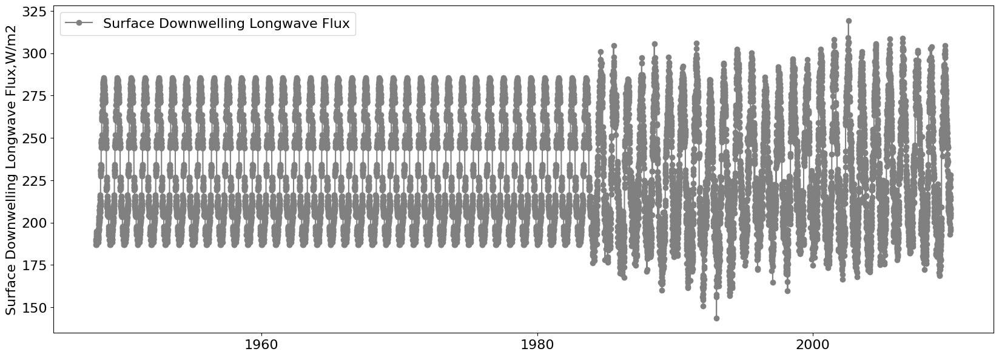

In [7]:
# Ploting just the Arctic North of 79.04348^oN
fig =plt.figure(figsize=(20, 7))
ax = fig.add_subplot(111)
pylab.plot(ds_lwdn.time,np.mean(ds_lwdn.lwdn[:,88::,:],axis=(1,2)), 'o-', color='gray', label = ds_lwdn.lwdn.long_name)
pylab.ylabel(ds_lwdn.lwdn.long_name+','+ds_lwdn.lwdn.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

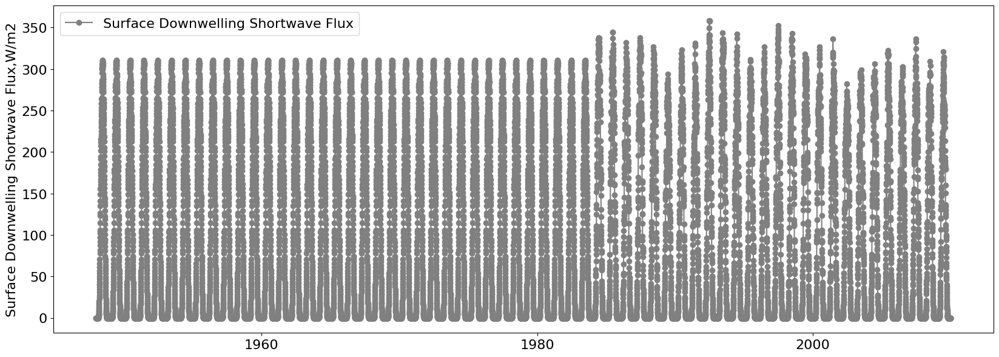

In [8]:
# Ploting just the Arctic North of 79.04348^oN
fig =plt.figure(figsize=(20, 7))
ax = fig.add_subplot(111)
pylab.plot(ds_swdn.time,np.mean(ds_swdn.swdn[:,88::,:],axis=(1,2)), 'o-', color='gray', label = ds_swdn.swdn.long_name)
pylab.ylabel(ds_swdn.swdn.long_name+','+ds_swdn.swdn.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

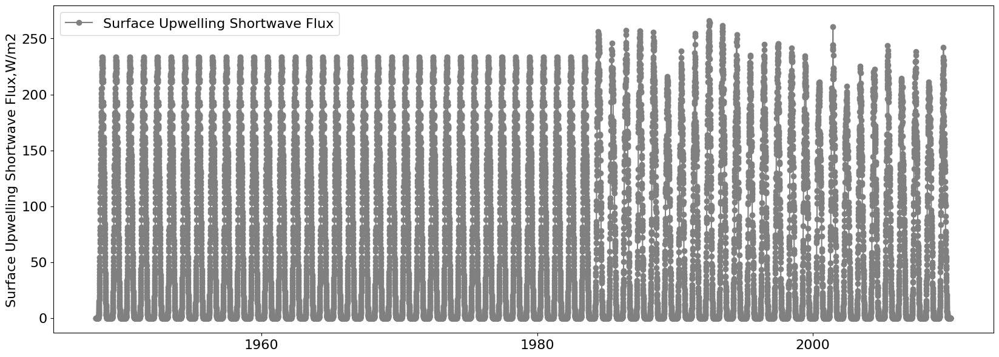

In [9]:
# Ploting just the Arctic North of 79.04348^oN
fig =plt.figure(figsize=(20, 7))
ax = fig.add_subplot(111)
pylab.plot(ds_swup.time,np.mean(ds_swup.swup[:,88::,:],axis=(1,2)), 'o-', color='gray', label = ds_swup.swup.long_name)
pylab.ylabel(ds_swup.swup.long_name+','+ds_swup.swup.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

In [23]:
Q_sw_out = ds_swup.swup[:,88::,:]
Q_sw_in = ds_swdn.swdn[:,88::,:]
Q_sw_net = Q_sw_in-Q_sw_out
Q_net = -Q_sw_net + ds_lwdn.lwdn[:,88::,:]

In [11]:
ds_swup.time

<xarray.DataArray 'time' (time: 22630)>
array([cftime.DatetimeNoLeap(1948, 1, 1, 12, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1948, 1, 2, 12, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1948, 1, 3, 12, 0, 0, 0, has_year_zero=True), ...,
       cftime.DatetimeNoLeap(2009, 12, 30, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2009, 12, 31, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2010, 1, 1, 0, 0, 0, 0, has_year_zero=True)],
      dtype=object)
Coordinates:
  * time     (time) object 1948-01-01 12:00:00 ... 2010-01-01 00:00:00
Attributes:
    long_name:  observation time

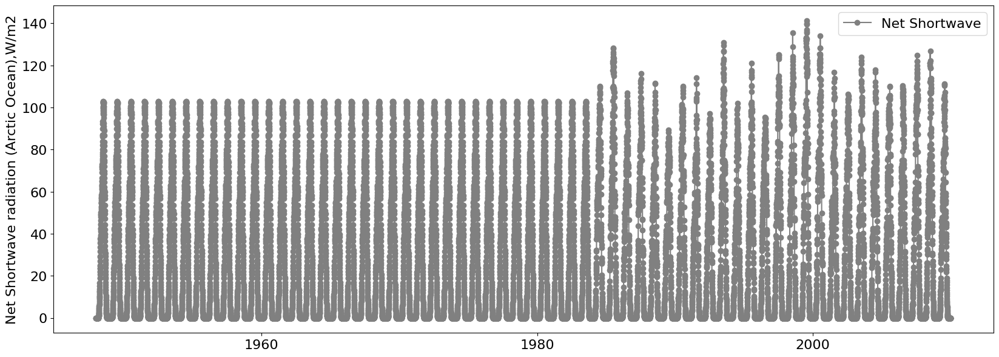

In [12]:
# Ploting just the Arctic North of 79.04348^oN
fig =plt.figure(figsize=(20, 7))
ax = fig.add_subplot(111)
pylab.plot(ds_swup.time,np.mean(Q_sw_net,axis=(1,2)), 'o-', color='gray', label = 'Net Shortwave')
pylab.ylabel('Net Shortwave radiation (Arctic Ocean),'+ds_swup.swup.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

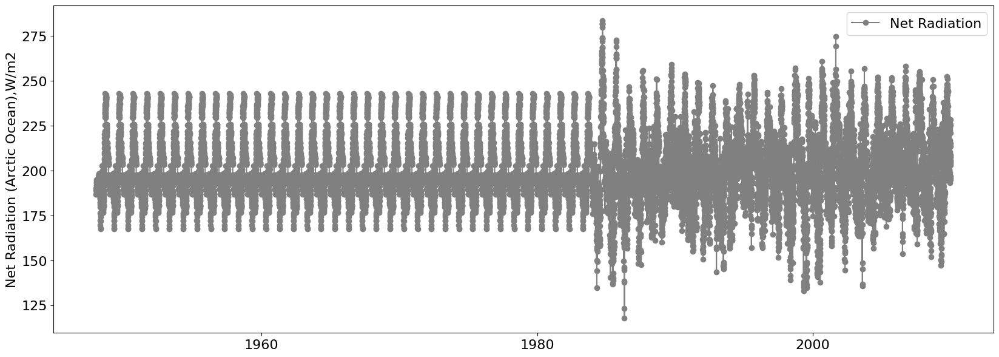

In [24]:
# Ploting just the Arctic North of 79.04348^oN
fig =plt.figure(figsize=(20, 7))
ax = fig.add_subplot(111)
pylab.plot(ds_swup.time,np.mean(Q_net,axis=(1,2)), 'o-', color='gray', label = 'Net Radiation')
pylab.ylabel('Net Radiation (Arctic Ocean),'+ds_swup.swup.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

### Air temperature, Kelvin, 10m shifted, NCEP 6 hour forecast data

In [8]:
# Air temperature, Kelvin, 10m shifted, NCEP 6 hour forecast data  
core2_t10 = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/ncep.t_10.T62.*'
newNCDFfiles_t10 = sorted(glob(f"{core2_t10}.nc", recursive=True),key=numericalSort)
files_x_t10 = [newNCDFfiles_t10[50],newNCDFfiles_t10[52],newNCDFfiles_t10[54],
               newNCDFfiles_t10[56],
               newNCDFfiles_t10[57],
               newNCDFfiles_t10[58],
               newNCDFfiles_t10[59],
               newNCDFfiles_t10[60],
               newNCDFfiles_t10[61],
               newNCDFfiles_t10[63],
              newNCDFfiles_t10[64],
              newNCDFfiles_t10[65],
              newNCDFfiles_t10[66]]
files_t10 = newNCDFfiles_t10[0:49]+files_x_t10

In [9]:
ds_t10= xr.open_mfdataset(files_t10,combine='by_coords')

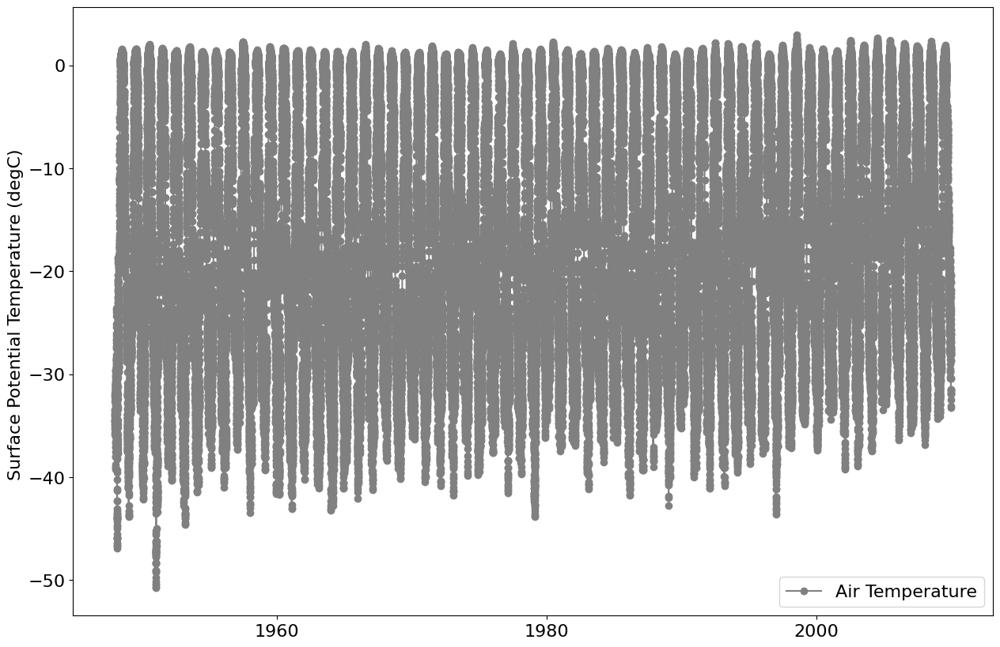

In [16]:
fig =plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111)
pylab.plot(ds_t10.time,np.mean(ds_t10.t_10[:,216::,:],axis=(1,2))-273.15, 'o-', color='gray', label = 'Air Temperature')
pylab.ylabel('Surface Potential Temperature (degC) ',fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

## Specific Humidity, kg/kg, 10m shifted, NCEP 6 hour forecast data

In [10]:
core2_q10 = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/ncep.q_10.T62.*'
newNCDFfiles_q10 = sorted(glob(f"{core2_q10}.nc", recursive=True),key=numericalSort)
files_x_q10 = [newNCDFfiles_q10[50],newNCDFfiles_q10[52],newNCDFfiles_q10[54],
               newNCDFfiles_q10[56],
               newNCDFfiles_q10[57],
               newNCDFfiles_q10[58],
               newNCDFfiles_q10[59],
               newNCDFfiles_q10[60],
               newNCDFfiles_q10[61],
               newNCDFfiles_q10[63],
              newNCDFfiles_q10[64],
              newNCDFfiles_q10[65],
              newNCDFfiles_q10[66]]
files_q10 = newNCDFfiles_q10[0:49]+files_x_q10

In [11]:
ds_q10= xr.open_mfdataset(files_q10,combine='by_coords')

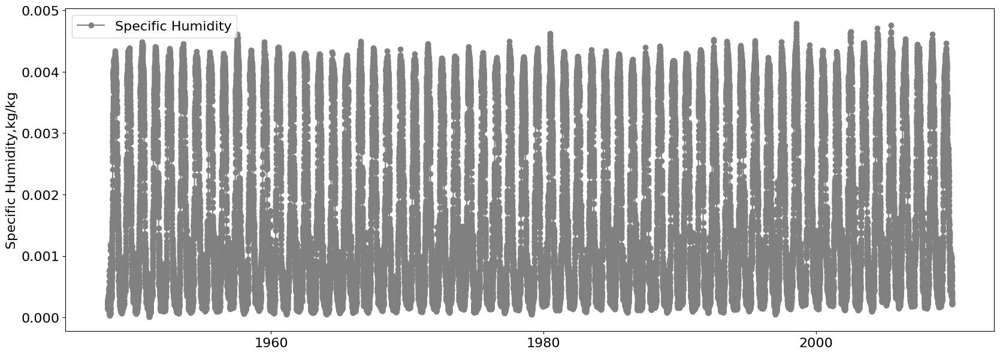

In [33]:
# Ploting just the Arctic North of 79.04348^oN
fig =plt.figure(figsize=(20, 7))
ax = fig.add_subplot(111)
pylab.plot(ds_q10.time,np.mean(ds_q10.q_10[:,216::,:],axis=(1,2)), 'o-', color='gray', label = ds_q10.q_10.long_name)
pylab.ylabel(ds_q10.q_10.long_name+','+ds_q10.q_10.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

### Air density, kg/m3, 10m computed, NCEP 6 hour forecast data

In [12]:
core2_dn10 = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/ncep.dn10.T62.*'
newNCDFfiles_dn10 = sorted(glob(f"{core2_dn10}.nc", recursive=True),key=numericalSort)
files_x_dn10 = [newNCDFfiles_dn10[50],newNCDFfiles_dn10[52],newNCDFfiles_dn10[54],
               newNCDFfiles_dn10[56],
               newNCDFfiles_dn10[57],
               newNCDFfiles_dn10[58],
               newNCDFfiles_dn10[59],
               newNCDFfiles_dn10[60],
               newNCDFfiles_dn10[61],
               newNCDFfiles_dn10[63],
              newNCDFfiles_dn10[64],
              newNCDFfiles_dn10[65],
              newNCDFfiles_dn10[66]]
files_dn10 = newNCDFfiles_dn10[0:49]+files_x_dn10

In [13]:
ds_dn10= xr.open_mfdataset(files_dn10,combine='by_coords')

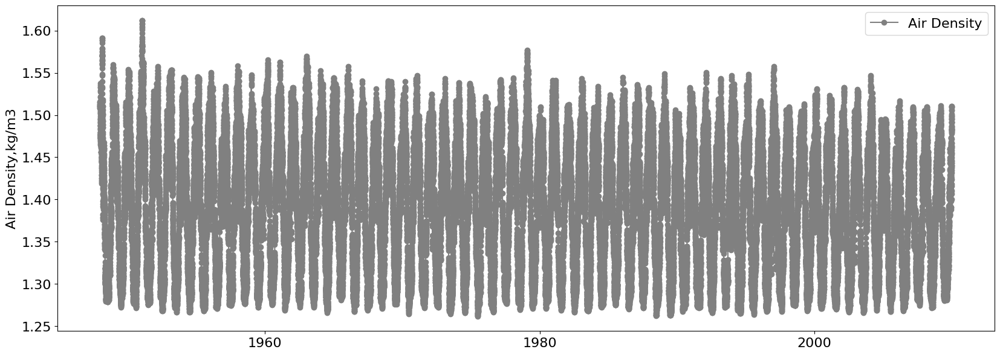

In [28]:
# Ploting just the Arctic North of 79.04348^oN
fig =plt.figure(figsize=(20, 7))
ax = fig.add_subplot(111)
pylab.plot(ds_dn10.time,np.mean(ds_dn10.dn10[:,216::,:],axis=(1,2)), 'o-', color='gray', label = ds_dn10.dn10.long_name)
pylab.ylabel(ds_dn10.dn10.long_name+','+ds_dn10.dn10.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

### Sea Level Pressure, Pa, 0m shifted, NCEP 6 hour forecast

In [14]:
core2_slp = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/ncep.slp_.T62.*'
newNCDFfiles_slp = sorted(glob(f"{core2_slp}.nc", recursive=True),key=numericalSort)
files_x_slp = [newNCDFfiles_slp[50],newNCDFfiles_slp[52],newNCDFfiles_slp[54],
               newNCDFfiles_slp[56],
               newNCDFfiles_slp[57],
               newNCDFfiles_slp[58],
               newNCDFfiles_slp[59],
               newNCDFfiles_slp[60],
               newNCDFfiles_slp[61],
               newNCDFfiles_slp[63],
              newNCDFfiles_slp[64],
              newNCDFfiles_slp[65],
              newNCDFfiles_slp[66]]
files_slp = newNCDFfiles_slp[0:49]+files_x_slp

In [15]:
ds_slp= xr.open_mfdataset(files_slp,combine='by_coords')

In [35]:
ds_slp.slp_

<xarray.DataArray 'slp_' (time: 90520, lat: 182, lon: 192)>
dask.array<concatenate, shape=(90520, 182, 192), dtype=float32, chunksize=(1460, 182, 192), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -88.54 -88.54 -86.65 -86.65 ... 86.65 88.54 88.54
  * lon      (lon) float32 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
  * time     (time) object 1948-01-01 06:00:00 ... 2009-12-31 23:59:52.089844
Attributes:
    long_name:      Sea Level Pressure
    units:          Pa
    level:           0m shifted
    sampling_time:  fcst-6
    note:           NCEP 6 hour forecast data

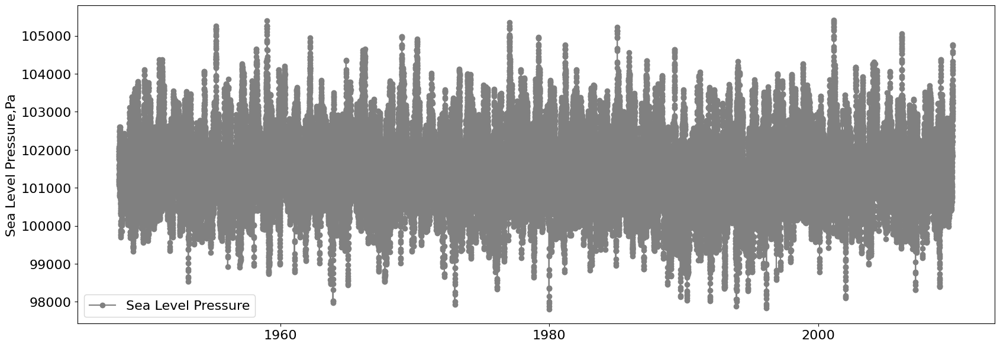

In [38]:
# Ploting just the Arctic North of 79.04348^oN
fig =plt.figure(figsize=(20, 7))
ax = fig.add_subplot(111)
pylab.plot(ds_slp.time,np.mean(ds_slp.slp_[:,170::,:],axis=(1,2)), 'o-', color='gray', label = ds_slp.slp_.long_name)
pylab.ylabel(ds_slp.slp_.long_name+','+ds_slp.slp_.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

### In meteorology, the terms "u" and "v" wind speeds refer to the horizontal components of the wind vector in a specific coordinate system. Wind speed is usually described as a vector because it has both magnitude (speed) and direction.

1. `"u" wind speed`: This represents the east-west (or `horizontal`) component of the wind. In some coordinate systems, especially when using meteorological conventions, positive "u" wind speeds represent wind blowing from the west to the east, while negative "u" wind speeds represent wind blowing from the east to the west.
2. `"v" wind speed`: This represents the north-south (or `vertical`) component of the wind. Positive "v" wind speeds represent wind blowing from the south to the north, while negative "v" wind speeds represent wind blowing from the north to the south.

Wind vectors are often used in meteorology and fluid dynamics to describe the movement of air or other fluids. By breaking down the wind into its "u" and "v" components, meteorologists can analyze and predict the wind patterns more effectively, especially in complex situations such as weather systems or atmospheric modeling.

`Net Wind Speed = √(u² + v²)`

### U Wind (m/s), 10m extracted NCEP 6 hour forecast data

In [16]:
core2_u10 = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/ncep.u_10.T62.*'
newNCDFfiles_u10 = sorted(glob(f"{core2_u10}.nc", recursive=True),key=numericalSort)
# V Wind (m/s), 10m extracted NCEP 6 hour forecast data
files_x_u10 = [newNCDFfiles_u10[50],newNCDFfiles_u10[52],newNCDFfiles_u10[54],
               newNCDFfiles_u10[56],
               newNCDFfiles_u10[57],
               newNCDFfiles_u10[58],
               newNCDFfiles_u10[59],
               newNCDFfiles_u10[60],
               newNCDFfiles_u10[61],
               newNCDFfiles_u10[63],
              newNCDFfiles_u10[64],
              newNCDFfiles_u10[65],
              newNCDFfiles_u10[66]]
files_u10 = newNCDFfiles_u10[0:49]+files_x_u10

In [17]:
ds_u10= xr.open_mfdataset(files_u10,combine='by_coords')

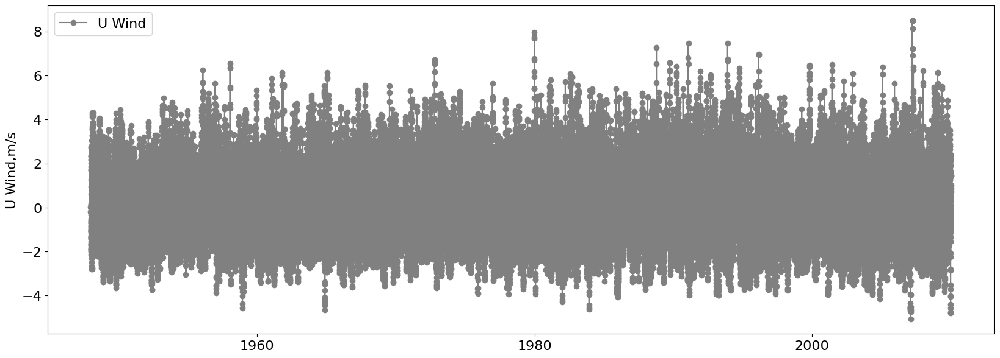

In [41]:
# Ploting just the Arctic North of 79.04348^oN
fig =plt.figure(figsize=(20, 7))
ax = fig.add_subplot(111)
pylab.plot(ds_u10.time,np.mean(ds_u10.u_10[:,216::,:],axis=(1,2)), 'o-', color='gray', label = ds_u10.u_10.long_name)
pylab.ylabel(ds_u10.u_10.long_name+','+ds_u10.u_10.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

### V Wind (m/s), 10m extracted NCEP 6 hour forecast data

In [18]:
core2_v10 = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/ncep.v_10.T62.*'
newNCDFfiles_v10 = sorted(glob(f"{core2_v10}.nc", recursive=True),key=numericalSort)
# V Wind (m/s), 10m extracted NCEP 6 hour forecast data
files_x_v10 = [newNCDFfiles_v10[50],newNCDFfiles_v10[52],newNCDFfiles_v10[54],
               newNCDFfiles_v10[56],
               newNCDFfiles_v10[57],
               newNCDFfiles_v10[58],
               newNCDFfiles_v10[59],
               newNCDFfiles_v10[60],
               newNCDFfiles_v10[61],
               newNCDFfiles_v10[63],
              newNCDFfiles_v10[64],
              newNCDFfiles_v10[65],
              newNCDFfiles_v10[66]]
files_v10 = newNCDFfiles_v10[0:49]+files_x_v10

In [19]:
ds_v10= xr.open_mfdataset(files_v10,combine='by_coords')

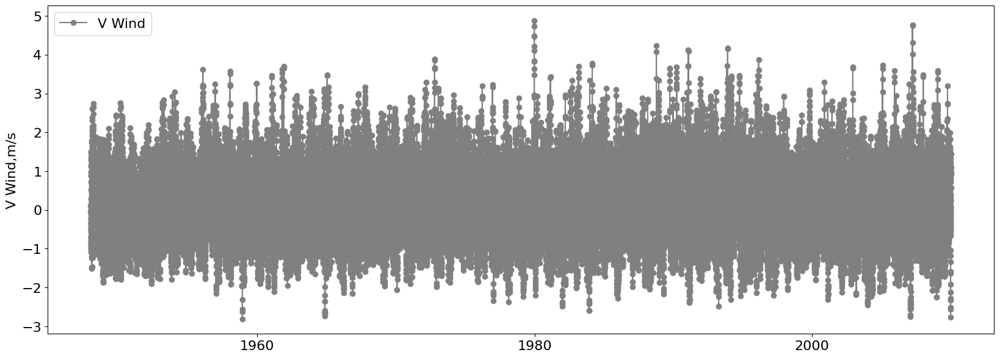

In [44]:
# Ploting just the Arctic North of 79.04348^oN
fig =plt.figure(figsize=(20, 7))
ax = fig.add_subplot(111)
pylab.plot(ds_v10.time,np.mean(ds_v10.v_10[:,216::,:],axis=(1,2)), 'o-', color='gray', label = ds_v10.v_10.long_name)
pylab.ylabel(ds_v10.v_10.long_name+','+ds_v10.v_10.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

`Net Wind Speed = √(u² + v²)`

In [20]:
net_w = np.sqrt(np.square(ds_v10.v_10[:,216::,:])+np.square(ds_u10.u_10[:,216::,:]))

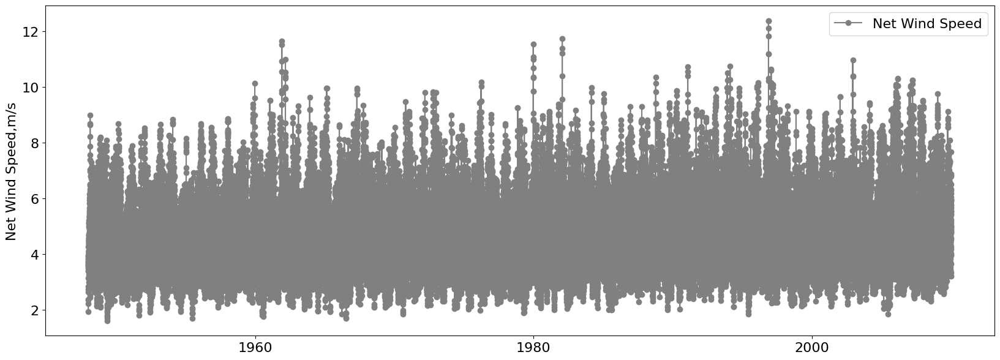

In [46]:
# Ploting just the Arctic North of 79.04348^oN
fig =plt.figure(figsize=(20, 7))
ax = fig.add_subplot(111)
pylab.plot(ds_v10.time,np.mean(net_w,axis=(1,2)), 'o-', color='gray', label = 'Net Wind Speed')
pylab.ylabel('Net Wind Speed,'+ds_v10.v_10.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

## Timeseries by Arctic Region

### The grid is different for these files compared to the other one....

In [86]:
lat = 94
lon = 192
arctic = np.zeros((12,lat,lon))
for i in range(88,94):
    arctic[:,i,:] = 0
    
for i in range(96,110):
    for j in range(78,88):
        arctic[:,j,i] = 1
        
for i in range(110,125):
    for j in range(78,88):
        arctic[:,j,i] = 2
  #       
for i in range(125,139):
    for j in range(78,88):
        arctic[:,j,i] = 3
        
for i in range(139,166):
    for j in range(78,88):
        arctic[:,j,i] = 4

for i in range(77,96):
    for j in range(78,88):
        arctic[:,j,i] = 9

for i in range(48,77):
    for j in range(78,88):
        arctic[:,j,i] = 8

for i in range(28,48):
    for j in range(78,88):
        arctic[:,j,i] = 7

for i in range(11,28):
    for j in range(78,88):
        arctic[:,j,i] = 6

for i in list(range(11)) + list(range(-27,1)):
    for j in range(78,88):
        arctic[:,j,i] = 5

In [26]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.pyplot import figure
import pylab 

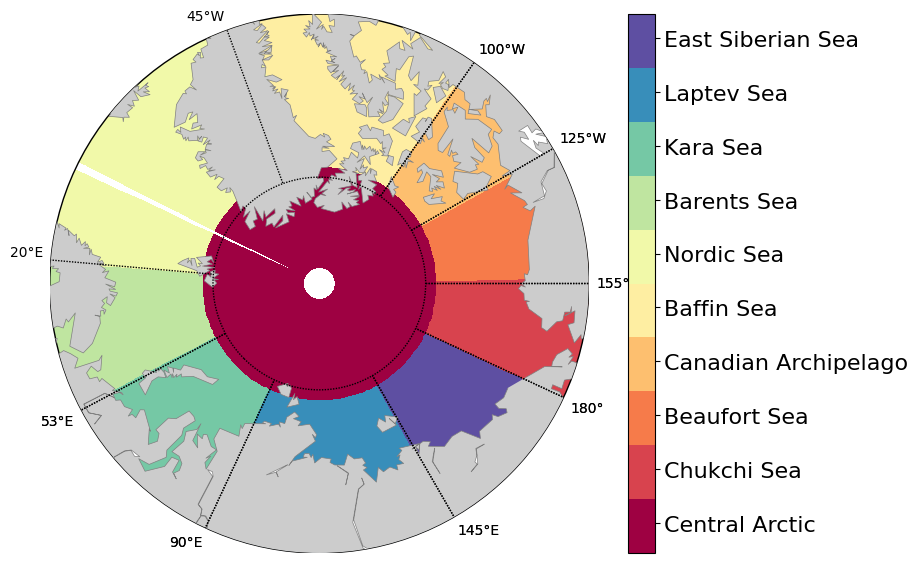

In [27]:
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(1, 1, 1)
m = Basemap(projection='npstere',round=True,
            boundinglat=65,
            lon_0=180+(-100+-30)/2.,resolution='c')

x, y = m(*np.meshgrid(ds_lwdn.lon,ds_lwdn.lat))

# plot the field using the fast pcolormesh routine 
# set the colormap to jet.

m.pcolormesh(x,y,arctic[0,:,:],shading='flat',cmap=plt.cm.get_cmap('Spectral', 10))
cbar=plt.colorbar() 
cbar.set_ticks([0.5,1.4,2.3,3.2,4.1,5.0,5.9,6.8,7.7,8.6])
cbar.set_ticklabels(['Central Arctic', 'Chukchi Sea', 'Beaufort Sea','Canadian Archipelago',
                     'Baffin Sea','Nordic Sea','Barents Sea','Kara Sea','Laptev Sea',
                     'East Siberian Sea'])
cbar.ax.tick_params(labelsize=16)


m.drawmeridians((180,205), color='k', textcolor='k', linewidth=1.0, 
              zorder=None, dashes=[1, 1], labels=[1, 1, 1, 1])
m.drawmeridians((205,235), color='k', textcolor='k', linewidth=1.0, 
              zorder=None, dashes=[1, 1], labels=[1, 1, 1, 1])
m.drawmeridians((235,260), color='k', textcolor='k', linewidth=1.0, 
              zorder=None, dashes=[1, 1], labels=[1, 1, 1, 1])
m.drawmeridians((260,315), color='k', textcolor='k', linewidth=1.0, 
              zorder=None, dashes=[1, 1], labels=[1, 1, 1, 1])
m.drawmeridians((145,180), color='k', textcolor='k', linewidth=1.0, 
              zorder=None, dashes=[1, 1], labels=[1, 1, 1, 1])
m.drawmeridians((90,145), color='k', textcolor='k', linewidth=1.0, 
              zorder=None, dashes=[1, 1], labels=[1, 1, 1, 1])
m.drawmeridians((53,90), color='k', textcolor='k', linewidth=1.0, 
              zorder=None, dashes=[1, 1], labels=[1, 1, 1, 1])
m.drawmeridians((20,53), color='k', textcolor='k', linewidth=1.0, 
              zorder=None, dashes=[1, 1], labels=[1, 1, 1, 1])
m.drawparallels((60,90), color='k', textcolor='k', 
                linewidth=1.0, zorder=None, dashes=[1, 1], 
                labels=[0, 0, 0, 0])
m.drawcoastlines(linewidth=0.5, linestyle='solid', color='gray', antialiased=1, ax=None, zorder=None)
m.fillcontinents(color='0.8', lake_color=None, ax=None, zorder=None, alpha=None)
m.plot
plt.show()

## Yearly average

In [28]:
df2 = ds_lwdn.indexes['time'].to_datetimeindex()

In [29]:
%%time
yrs = np.arange(1948,2010,1)
mn = np.arange(1,13,1)

lwdn_month = np.empty([62, 12,94,192])
swdn_month = np.empty([62, 12,94,192])
swup_month = np.empty([62, 12,94,192])

ds2 = xr.Dataset()
for i, idx in enumerate(yrs):
    tmp = df2.year==idx
    for y, idy in enumerate(mn):
        lwdn_month[i,y,:,:] = np.nanmean(ds_lwdn.lwdn[np.where((df2.year==idx) &  (df2.month==idy))],axis=0)
        swdn_month[i,y,:,:] = np.nanmean(ds_swdn.swdn[np.where((df2.year==idx) &  (df2.month==idy))],axis=0)
        swup_month[i,y,:,:] = np.nanmean(ds_swup.swup[np.where((df2.year==idx) &  (df2.month==idy))],axis=0)

CPU times: user 38.9 s, sys: 46.4 s, total: 1min 25s
Wall time: 1min 52s


In [30]:
lwdn_month.shape

(62, 12, 94, 192)

In [31]:
temp_ao = np.nanmean(lwdn_month[:,:,88::,:], axis=(1,2,3))
temp_cs = np.nanmean(lwdn_month[:,:,78:88,96:110], axis = (1,2,3))
temp_bs = np.nanmean(lwdn_month[:,:,78:88,110:125], axis = (1,2,3))
temp_ca = np.nanmean(lwdn_month[:,:,78:88,125:139], axis = (1,2,3))
temp_bb = np.nanmean(lwdn_month[:,:,78:88,139:166], axis = (1,2,3))
temp_ess = np.nanmean(lwdn_month[:,:,78:88,77:96], axis = (1,2,3))
temp_ls = np.nanmean(lwdn_month[:,:,78:88,48:77], axis = (1,2,3))
temp_ns = np.nanmean(lwdn_month[:,:,78:88,list(range(11)) + list(range(-27,1))], axis = (1,2,3))
temp_bts =np.nanmean(lwdn_month[:,:,78:88,11:28], axis = (1,2,3))
temp_ks = np.nanmean(lwdn_month[:,:,78:88,28:48], axis = (1,2,3))

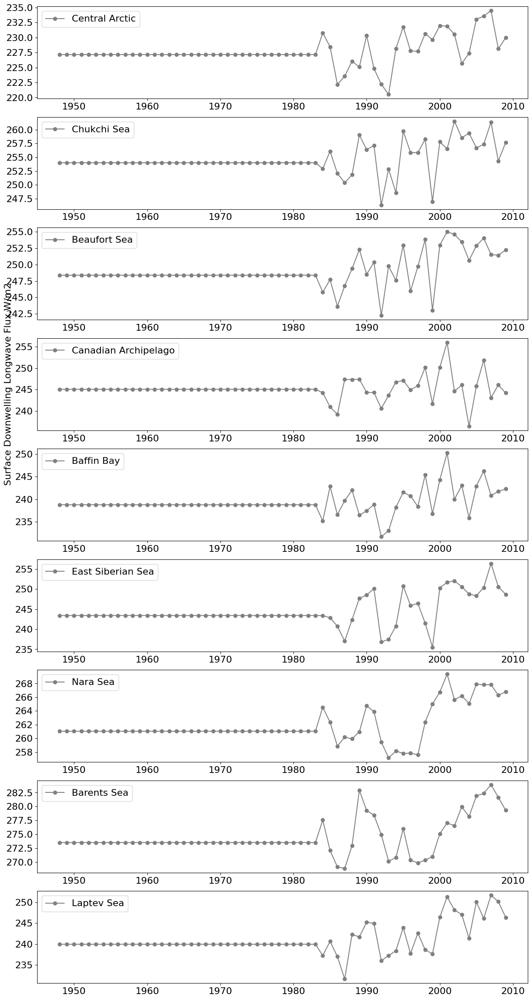

In [32]:
fig =plt.figure(figsize=(15, 30))
ax = fig.add_subplot(911)
pylab.plot(yrs,temp_ao, 'o-', color='gray', label = 'Central Arctic')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(912)
pylab.plot(yrs,temp_cs, 'o-', color='gray', label = 'Chukchi Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(913)
pylab.plot(yrs,temp_bs, 'o-', color='gray', label = 'Beaufort Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(914)
pylab.plot(yrs,temp_ca, 'o-', color='gray', label = 'Canadian Archipelago')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

pylab.ylabel(ds_lwdn.lwdn.long_name+','+ds_lwdn.lwdn.units,fontsize = 16)

ax = fig.add_subplot(915)
pylab.plot(yrs,temp_bb, 'o-', color='gray', label = 'Baffin Bay')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(916)
pylab.plot(yrs,temp_ess, 'o-', color='gray', label = 'East Siberian Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(917)
pylab.plot(yrs,temp_ns, 'o-', color='gray', label = 'Nara Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(918)
pylab.plot(yrs,temp_bts, 'o-', color='gray', label = 'Barents Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(919)
pylab.plot(yrs,temp_ls, 'o-', color='gray', label = 'Laptev Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

#ax = fig.add_subplot(5210)
#pylab.plot(ds.time,temp_ks, 'o-', color='gray', label = 'Kara Sea')
#plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

In [33]:
temp_ao = np.nanmean(swdn_month[:,:,88::,:], axis=(1,2,3))
temp_cs = np.nanmean(swdn_month[:,:,78:88,96:110], axis = (1,2,3))
temp_bs = np.nanmean(swdn_month[:,:,78:88,110:125], axis = (1,2,3))
temp_ca = np.nanmean(swdn_month[:,:,78:88,125:139], axis = (1,2,3))
temp_bb = np.nanmean(swdn_month[:,:,78:88,139:166], axis = (1,2,3))
temp_ess = np.nanmean(swdn_month[:,:,78:88,77:96], axis = (1,2,3))
temp_ls = np.nanmean(swdn_month[:,:,78:88,48:77], axis = (1,2,3))
temp_ns = np.nanmean(swdn_month[:,:,78:88,list(range(11)) + list(range(-27,1))], axis = (1,2,3))
temp_bts =np.nanmean(swdn_month[:,:,78:88,11:28], axis = (1,2,3))
temp_ks = np.nanmean(swdn_month[:,:,78:88,28:48], axis = (1,2,3))

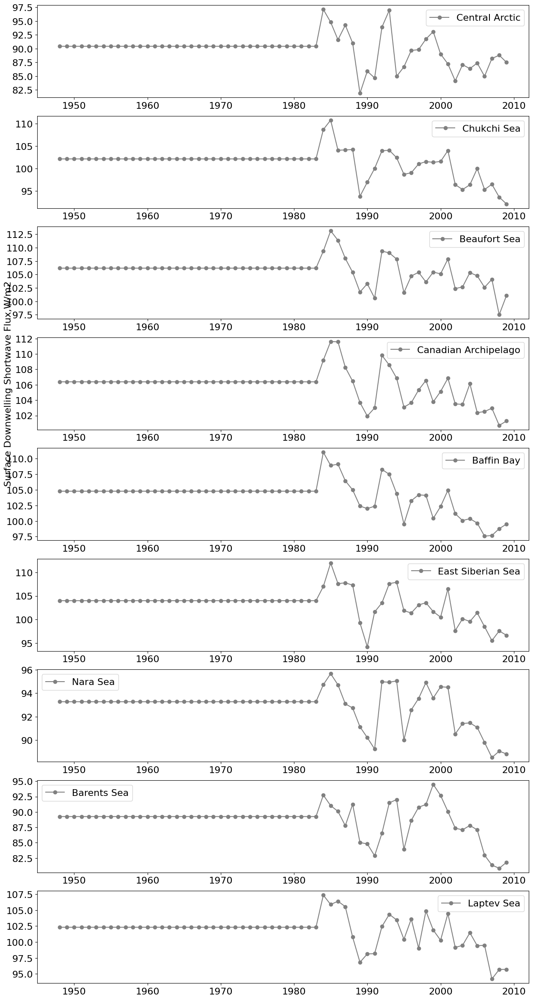

In [34]:
fig =plt.figure(figsize=(15, 30))
ax = fig.add_subplot(911)
pylab.plot(yrs,temp_ao, 'o-', color='gray', label = 'Central Arctic')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(912)
pylab.plot(yrs,temp_cs, 'o-', color='gray', label = 'Chukchi Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(913)
pylab.plot(yrs,temp_bs, 'o-', color='gray', label = 'Beaufort Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(914)
pylab.plot(yrs,temp_ca, 'o-', color='gray', label = 'Canadian Archipelago')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

pylab.ylabel(ds_swdn.swdn.long_name+','+ds_swdn.swdn.units,fontsize = 16)

ax = fig.add_subplot(915)
pylab.plot(yrs,temp_bb, 'o-', color='gray', label = 'Baffin Bay')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(916)
pylab.plot(yrs,temp_ess, 'o-', color='gray', label = 'East Siberian Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(917)
pylab.plot(yrs,temp_ns, 'o-', color='gray', label = 'Nara Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(918)
pylab.plot(yrs,temp_bts, 'o-', color='gray', label = 'Barents Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(919)
pylab.plot(yrs,temp_ls, 'o-', color='gray', label = 'Laptev Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

#ax = fig.add_subplot(5210)
#pylab.plot(ds.time,temp_ks, 'o-', color='gray', label = 'Kara Sea')
#plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

In [35]:
temp_ao = np.nanmean(swup_month[:,:,88::,:], axis=(1,2,3))
temp_cs = np.nanmean(swup_month[:,:,78:88,96:110], axis = (1,2,3))
temp_bs = np.nanmean(swup_month[:,:,78:88,110:125], axis = (1,2,3))
temp_ca = np.nanmean(swup_month[:,:,78:88,125:139], axis = (1,2,3))
temp_bb = np.nanmean(swup_month[:,:,78:88,139:166], axis = (1,2,3))
temp_ess = np.nanmean(swup_month[:,:,78:88,77:96], axis = (1,2,3))
temp_ls = np.nanmean(swup_month[:,:,78:88,48:77], axis = (1,2,3))
temp_ns = np.nanmean(swup_month[:,:,78:88,list(range(11)) + list(range(-27,1))], axis = (1,2,3))
temp_bts =np.nanmean(swup_month[:,:,78:88,11:28], axis = (1,2,3))
temp_ks = np.nanmean(swup_month[:,:,78:88,28:48], axis = (1,2,3))

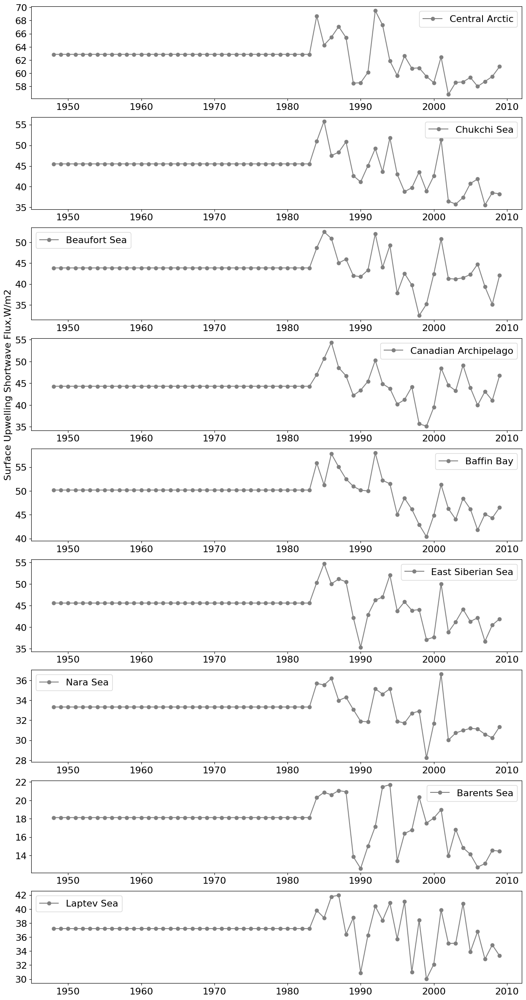

In [36]:
fig =plt.figure(figsize=(15, 30))
ax = fig.add_subplot(911)
pylab.plot(yrs,temp_ao, 'o-', color='gray', label = 'Central Arctic')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(912)
pylab.plot(yrs,temp_cs, 'o-', color='gray', label = 'Chukchi Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(913)
pylab.plot(yrs,temp_bs, 'o-', color='gray', label = 'Beaufort Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(914)
pylab.plot(yrs,temp_ca, 'o-', color='gray', label = 'Canadian Archipelago')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

pylab.ylabel(ds_swup.swup.long_name+','+ds_swup.swup.units,fontsize = 16)

ax = fig.add_subplot(915)
pylab.plot(yrs,temp_bb, 'o-', color='gray', label = 'Baffin Bay')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(916)
pylab.plot(yrs,temp_ess, 'o-', color='gray', label = 'East Siberian Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(917)
pylab.plot(yrs,temp_ns, 'o-', color='gray', label = 'Nara Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(918)
pylab.plot(yrs,temp_bts, 'o-', color='gray', label = 'Barents Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(919)
pylab.plot(yrs,temp_ls, 'o-', color='gray', label = 'Laptev Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

#ax = fig.add_subplot(5210)
#pylab.plot(ds.time,temp_ks, 'o-', color='gray', label = 'Kara Sea')
#plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

### Try to create an anomaly plot like the one on this website: `https://www.climate4you.com/GlobalTemperatures.htm#Annual%20air%20temperatures%20global`
- Anomalies of global annual surface air temperature (MAAT) since 1850 according to Hadley CRUT, a cooperative effort between the Hadley Centre for Climate Prediction and Research and the University of East Anglia's Climatic Research Unit (CRU), UK. The average for 1979-2008 (30 yrs) has been set to zero, to make comparison with other temperature data series (above and below) easy. 

In [58]:
swup_1979_2008 =  np.nanmean(swup_month[31:61,:,88::,:],axis=(0))
swdn_1979_2008 =  np.nanmean(swdn_month[31:61,:,88::,:],axis=(0))
lwdn_1979_2008 =  np.nanmean(lwdn_month[31:61,:,88::,:],axis=(0))
yrs_30 = np.arange(1979,2009,1)

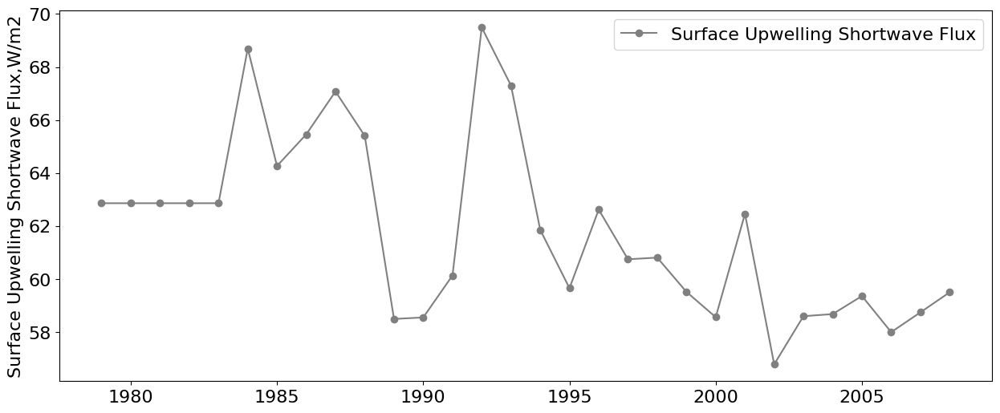

In [59]:
fig =plt.figure(figsize=(15, 6))
ax = fig.add_subplot(111)
pylab.plot(yrs_30,np.nanmean(swup_month[31:61,:,88::,:],axis=(1,2,3)), 'o-', color='gray', label = ds_swup.swup.long_name)
pylab.ylabel(ds_swup.swup.long_name+','+ds_swup.swup.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

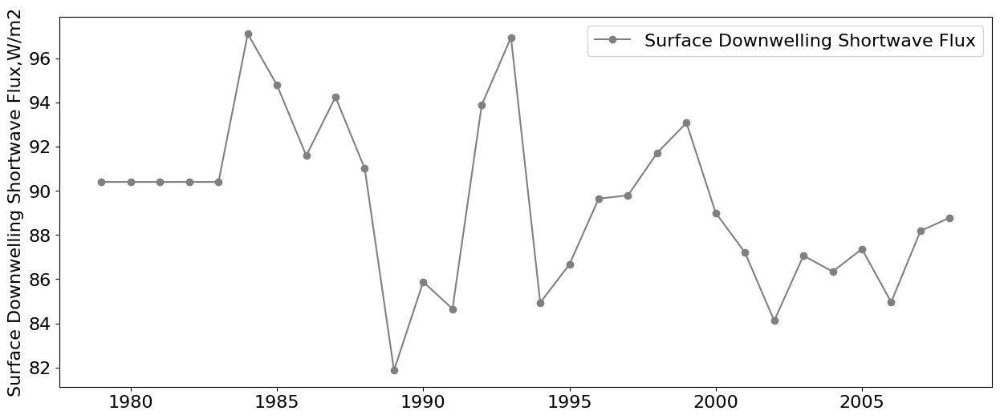

In [60]:
fig =plt.figure(figsize=(15, 6))
ax = fig.add_subplot(111)
pylab.plot(yrs_30,np.nanmean(swdn_month[31:61,:,88::,:],axis=(1,2,3)), 'o-', color='gray', label = ds_swdn.swdn.long_name)
pylab.ylabel(ds_swdn.swdn.long_name+','+ds_swdn.swdn.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

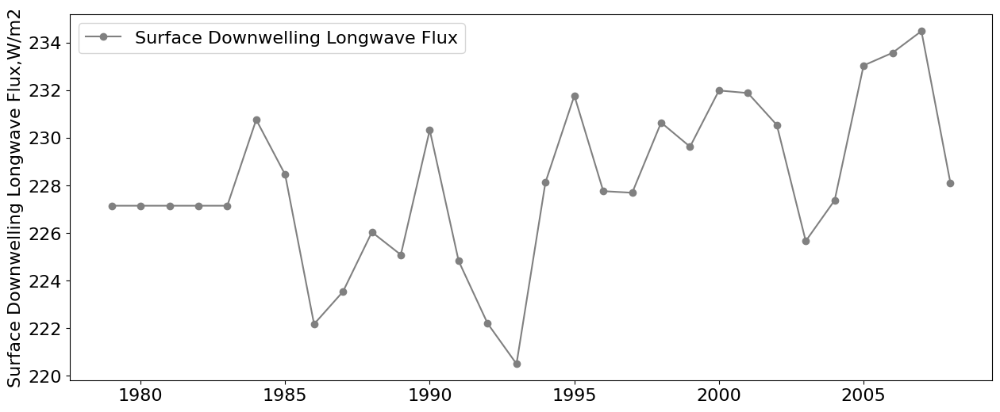

In [61]:
fig =plt.figure(figsize=(15, 6))
ax = fig.add_subplot(111)
pylab.plot(yrs_30,np.nanmean(lwdn_month[31:61,:,88::,:],axis=(1,2,3)), 'o-', color='gray', label = ds_lwdn.lwdn.long_name)
pylab.ylabel(ds_lwdn.lwdn.long_name+','+ds_lwdn.lwdn.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

## Check out if they balanance eachother! 

In [62]:
heat_balance = lwdn_month - swdn_month -swup_month

In [63]:
heat_balance.shape

(62, 12, 94, 192)

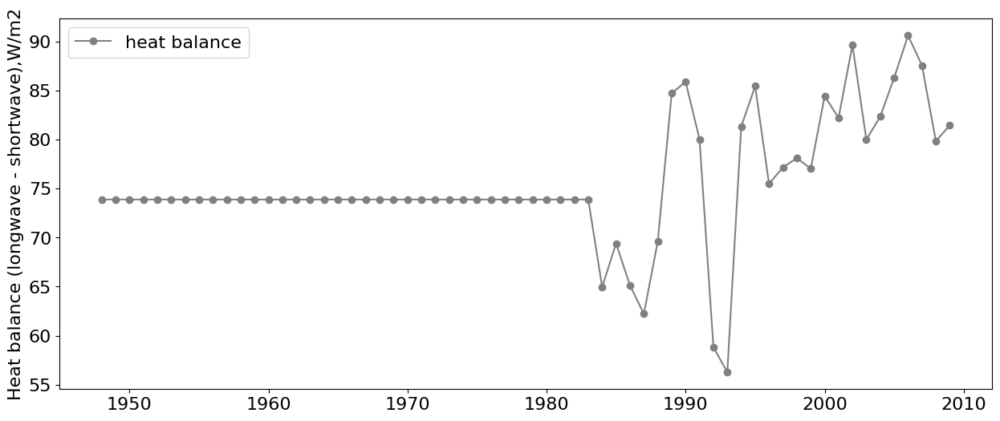

In [64]:
fig =plt.figure(figsize=(15, 6))
ax = fig.add_subplot(111)
pylab.plot(years,np.nanmean(heat_balance[:,:,88::,:],axis=(1,2,3)), 'o-', color='gray', label = 'heat balance')
pylab.ylabel('Heat balance (longwave - shortwave),'+ds_swup.swup.units,fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

In [65]:
temp_ao = np.nanmean(heat_balance[:,:,88::,:], axis=(1,2,3))
temp_cs = np.nanmean(heat_balance[:,:,78:88,96:110], axis = (1,2,3))
temp_bs = np.nanmean(heat_balance[:,:,78:88,110:125], axis = (1,2,3))
temp_ca = np.nanmean(heat_balance[:,:,78:88,125:139], axis = (1,2,3))
temp_bb = np.nanmean(heat_balance[:,:,78:88,139:166], axis = (1,2,3))
temp_ess = np.nanmean(heat_balance[:,:,78:88,77:96], axis = (1,2,3))
temp_ls = np.nanmean(heat_balance[:,:,78:88,48:77], axis = (1,2,3))
temp_ns = np.nanmean(heat_balance[:,:,78:88,list(range(11)) + list(range(-27,1))], axis = (1,2,3))
temp_bts =np.nanmean(heat_balance[:,:,78:88,11:28], axis = (1,2,3))
temp_ks = np.nanmean(heat_balance[:,:,78:88,28:48], axis = (1,2,3))

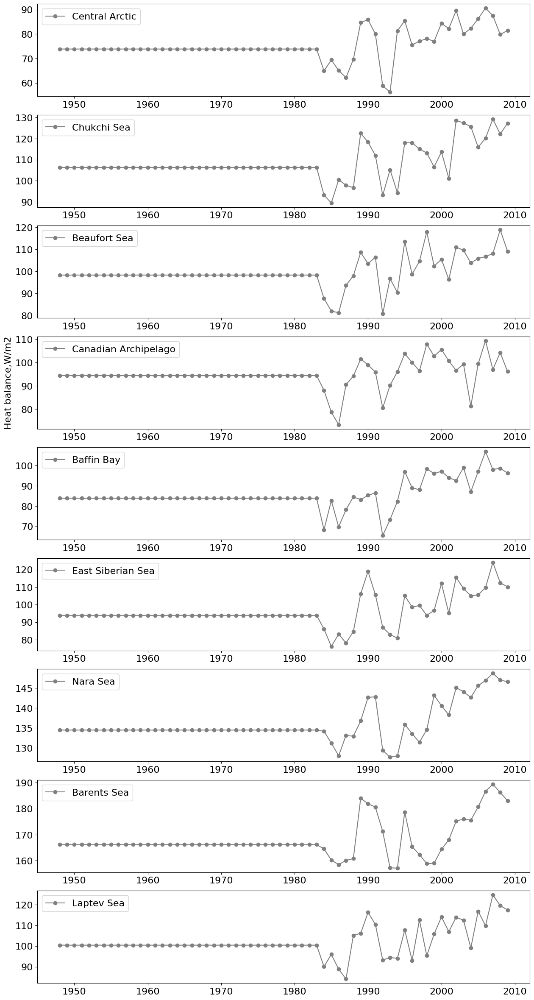

In [66]:
fig =plt.figure(figsize=(15, 30))
ax = fig.add_subplot(911)
pylab.plot(years,temp_ao, 'o-', color='gray', label = 'Central Arctic')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(912)
pylab.plot(years,temp_cs, 'o-', color='gray',  label = 'Chukchi Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(913)
pylab.plot(years,temp_bs, 'o-', color='gray',  label = 'Beaufort Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(914)
pylab.plot(years,temp_ca, 'o-', color='gray',  label = 'Canadian Archipelago')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

pylab.ylabel('Heat balance,'+ds_lwdn.lwdn.units,fontsize = 16)

ax = fig.add_subplot(915)
pylab.plot(years,temp_bb, 'o-', color='gray',  label = 'Baffin Bay')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(916)
pylab.plot(years,temp_ess,'o-', color='gray',  label = 'East Siberian Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(917)
pylab.plot(years,temp_ns, 'o-', color='gray',  label = 'Nara Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(918)
pylab.plot(years,temp_bts, 'o-', color='gray',  label = 'Barents Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(919)
pylab.plot(years,temp_ls, 'o-', color='gray',  label = 'Laptev Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

#ax = fig.add_subplot(5210)
#pylab.plot(ds.time,temp_ks, 'o-', color='gray', label = 'Kara Sea')
#plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

## Check the bias comparing with a 30 year clim

In [50]:
swup_bias = swup_month-swup_1979_2008
swdn_bias = swdn_month-swdn_1979_2008
lwdn_bias = lwdn_month-lwdn_1979_2008
years = np.arange(1948,2010,1)

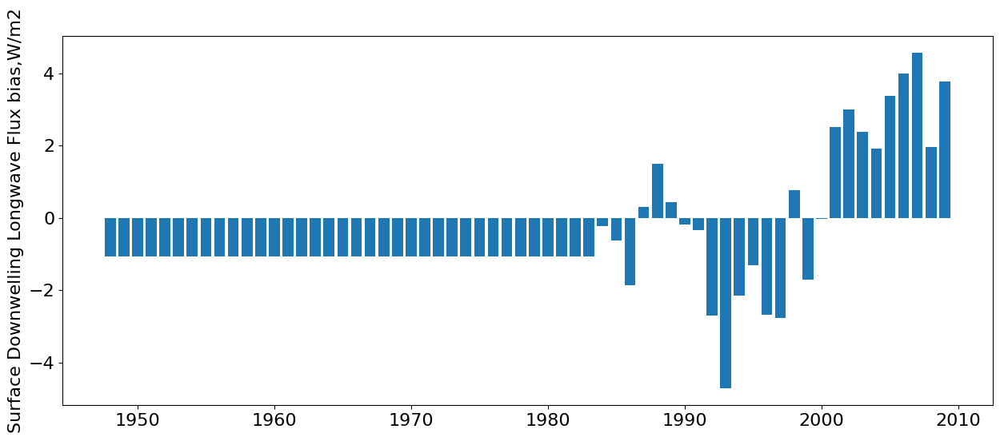

In [51]:
fig =plt.figure(figsize=(15, 6))
ax = fig.add_subplot(111)
plt.bar(years,np.nanmean(lwdn_bias,axis=(1,2,3)))
plt.ylabel(ds_lwdn.lwdn.long_name+' bias,'+ds_lwdn.lwdn.units,fontsize = 16)
plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

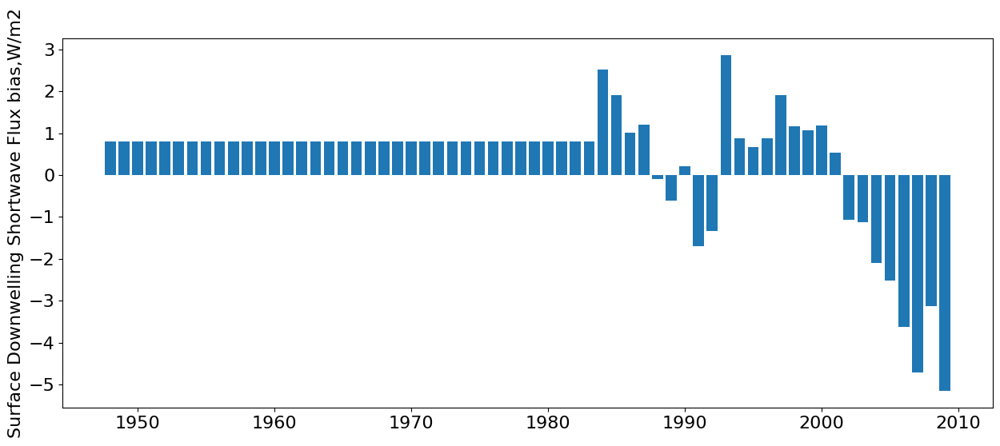

In [52]:
fig =plt.figure(figsize=(15, 6))
ax = fig.add_subplot(111)
plt.bar(years,np.nanmean(swdn_bias,axis=(1,2,3)))
plt.ylabel(ds_swdn.swdn.long_name+' bias,'+ds_swdn.swdn.units,fontsize = 16)
plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

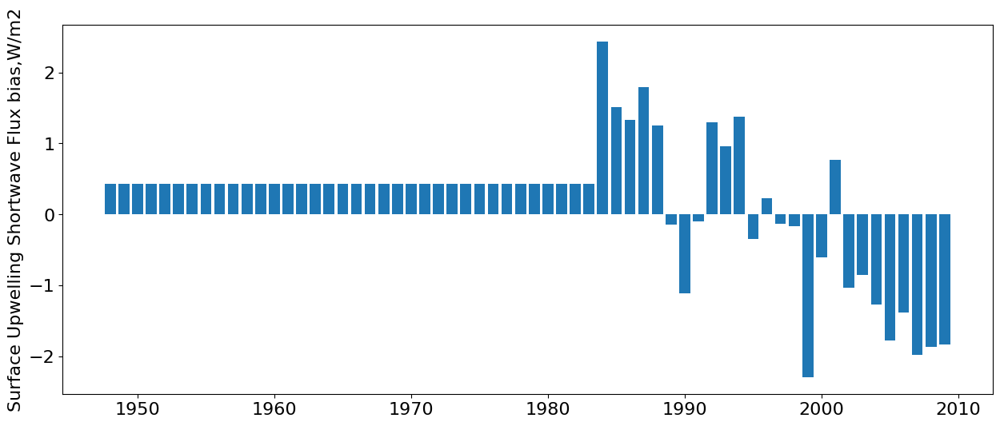

In [53]:
fig =plt.figure(figsize=(15, 6))
ax = fig.add_subplot(111)
plt.bar(years,np.nanmean(swup_bias,axis=(1,2,3)))
plt.ylabel(ds_swup.swup.long_name+' bias,'+ds_swup.swup.units,fontsize = 16)
plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

## Now let's check the temperature 

In [67]:
core2_t10 = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/ncep.t_10.T62.*'

In [68]:
# Air temperature, Kelvin, 10m shifted, NCEP 6 hour forecast data  
core2_t10 = '/glade/p/cesmdata/cseg/inputdata/ocn/iaf/ncep.t_10.T62.*'
newNCDFfiles = sorted(glob(f"{core2_t10}.nc", recursive=True),key=numericalSort)
files = (newNCDFfiles[0:49],newNCDFfiles[50],
         newNCDFfiles[52],
        newNCDFfiles[54],
        newNCDFfiles[56],
        newNCDFfiles[57:62],
        newNCDFfiles[63:67])
files_02 = [newNCDFfiles[50],newNCDFfiles[52],newNCDFfiles[54],newNCDFfiles[56]]
files = newNCDFfiles[0:49]+files_02+newNCDFfiles[57:62]+newNCDFfiles[63:67]
ds= xr.open_mfdataset(files,combine='by_coords')

fig =plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111)
pylab.plot(ds.time,np.mean(ds.t_10[:,215::,:],axis=(1,2))-273.15, 'o-', color='gray', label = 'Air Temperature')
pylab.ylabel('Surface Potential Temperature (degC) ',fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

In [69]:
files = (newNCDFfiles[0:49],newNCDFfiles[50],
         newNCDFfiles[52],
        newNCDFfiles[54],
        newNCDFfiles[56],
        newNCDFfiles[57:62],
        newNCDFfiles[63:67])
files_02 = [newNCDFfiles[50],newNCDFfiles[52],newNCDFfiles[54],newNCDFfiles[56]]
files = newNCDFfiles[0:49]+files_02+newNCDFfiles[57:62]+newNCDFfiles[63:67]

In [70]:
ds= xr.open_mfdataset(files,combine='by_coords')

In [71]:
ds.t_10

<xarray.DataArray 't_10' (time: 90520, lat: 230, lon: 192)>
dask.array<concatenate, shape=(90520, 230, 192), dtype=float32, chunksize=(1460, 230, 192), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -88.54 -88.54 -86.65 -86.65 ... 86.65 88.54 88.54
  * lon      (lon) float32 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
  * time     (time) object 1948-01-01 06:00:00 ... 2009-12-31 23:59:52.089844
Attributes:
    long_name:      Air Temperature
    units:          Kelvin
    level:          10m shifted
    sampling_time:  fcst-6
    note:           NCEP 6 hour forecast data

In [75]:
ds.lat[215]

<xarray.DataArray 'lat' ()>
array(77.13935089)
Coordinates:
    lat      float64 77.14
Attributes:
    long_name:  latitude
    units:      degrees_north

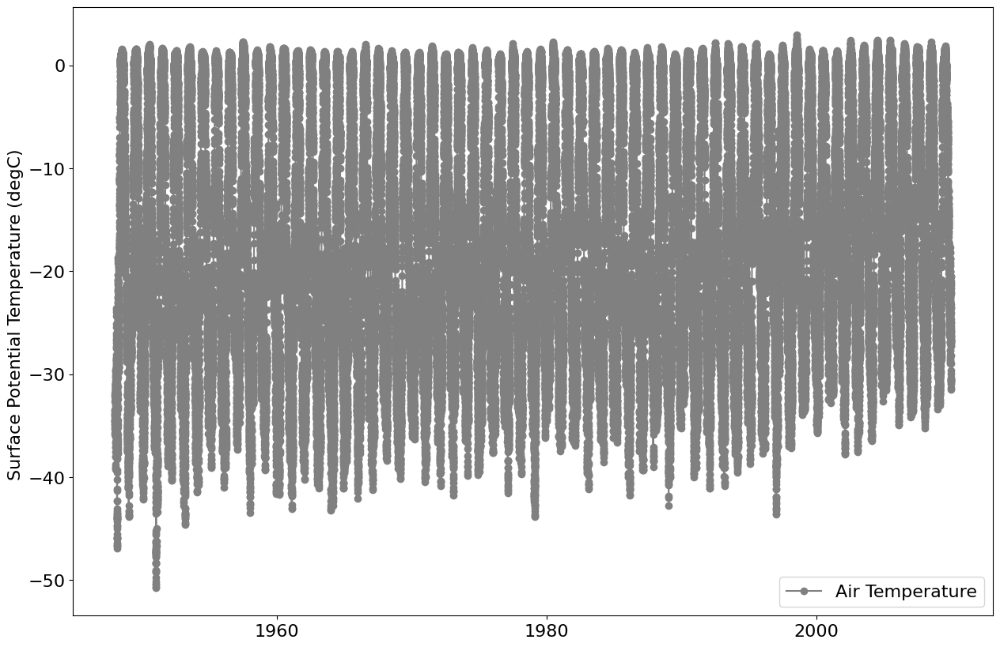

In [76]:
fig =plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111)
pylab.plot(ds.time,np.mean(ds.t_10[:,215::,:],axis=(1,2))-273.15, 'o-', color='gray', label = 'Air Temperature')
pylab.ylabel('Surface Potential Temperature (degC) ',fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

In [77]:
df2 = ds.indexes['time'].to_datetimeindex()

In [78]:
%%time
yrs = np.arange(1948,2010,1)
mn = np.arange(1,13,1)

t_10_month = np.empty([62, 12,230,192])

ds2 = xr.Dataset()
for i, idx in enumerate(yrs):
    tmp = df2.year==idx
    for y, idy in enumerate(mn):
        t_10_month[i,y,:,:] = np.nanmean(ds.t_10[np.where((df2.year==idx) &  (df2.month==idy))],axis=0)

CPU times: user 3min 41s, sys: 4min 50s, total: 8min 31s
Wall time: 9min 28s


In [79]:
temp_ao = np.nanmean(t_10_month[:,:,218:230,:], axis=(1,2,3))
temp_cs = np.nanmean(t_10_month[:,:,191:218,96:110], axis = (1,2,3))
temp_bs = np.nanmean(t_10_month[:,:,191:218,110:125], axis = (1,2,3))
temp_ca = np.nanmean(t_10_month[:,:,191:218,125:139], axis = (1,2,3))
temp_bb = np.nanmean(t_10_month[:,:,191:218,139:166], axis = (1,2,3))
temp_ess = np.nanmean(t_10_month[:,:,191:218,77:96], axis = (1,2,3))
temp_ls = np.nanmean(t_10_month[:,:,191:218,48:77], axis = (1,2,3))
temp_ns = np.nanmean(t_10_month[:,:,191:218,list(range(11)) + list(range(-27,1))], axis = (1,2,3))
temp_bts =np.nanmean(t_10_month[:,:,191:218,11:28], axis = (1,2,3))
temp_ks = np.nanmean(t_10_month[:,:,191:218,28:48], axis = (1,2,3))

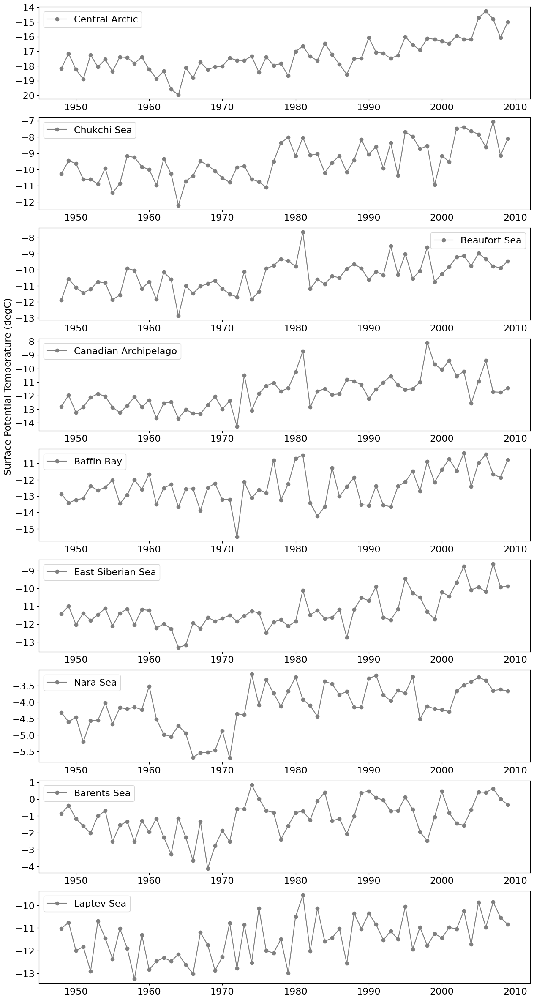

In [80]:
fig =plt.figure(figsize=(15, 30))
ax = fig.add_subplot(911)
pylab.plot(yrs,temp_ao-273.15, 'o-', color='gray', label = 'Central Arctic')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(912)
pylab.plot(yrs,temp_cs-273.15, 'o-', color='gray', label = 'Chukchi Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(913)
pylab.plot(yrs,temp_bs-273.15, 'o-', color='gray', label = 'Beaufort Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(914)
pylab.plot(yrs,temp_ca-273.15, 'o-', color='gray', label = 'Canadian Archipelago')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

pylab.ylabel('Surface Potential Temperature (degC) ',fontsize = 16)

ax = fig.add_subplot(915)
pylab.plot(yrs,temp_bb-273.15, 'o-', color='gray', label = 'Baffin Bay')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(916)
pylab.plot(yrs,temp_ess-273.15, 'o-', color='gray', label = 'East Siberian Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(917)
pylab.plot(yrs,temp_ns-273.15, 'o-', color='gray', label = 'Nara Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(918)
pylab.plot(yrs,temp_bts-273.15, 'o-', color='gray', label = 'Barents Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

ax = fig.add_subplot(919)
pylab.plot(yrs,temp_ls-273.15, 'o-', color='gray', label = 'Laptev Sea')
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);

#ax = fig.add_subplot(5210)
#pylab.plot(ds.time,temp_ks, 'o-', color='gray', label = 'Kara Sea')
#plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

### Try to create an anomaly plot like the one on this website: `https://www.climate4you.com/GlobalTemperatures.htm#Annual%20air%20temperatures%20global`
- Anomalies of global annual surface air temperature (MAAT) since 1850 according to Hadley CRUT, a cooperative effort between the Hadley Centre for Climate Prediction and Research and the University of East Anglia's Climatic Research Unit (CRU), UK. The average for 1979-2008 (30 yrs) has been set to zero, to make comparison with other temperature data series (above and below) easy. 

In [81]:
t_1979_2008 =  np.nanmean(t_10_month[31:61,:,215::,:],axis=(0))
yrs_30 = np.arange(1979,2009,1)

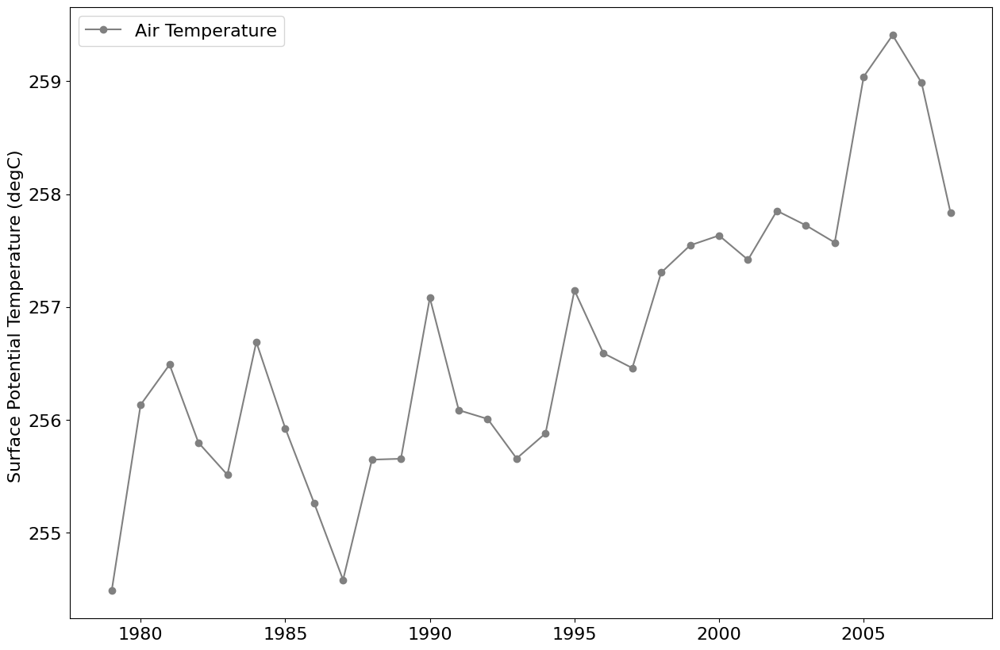

In [82]:
fig =plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111)
pylab.plot(yrs_30,np.nanmean(t_10_month[31:61,:,215::,:],axis=(1,2,3)), 'o-', color='gray', label = 'Air Temperature')
pylab.ylabel('Surface Potential Temperature (degC) ',fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

In [85]:
t_10_bias = t_10_month[:,:,215::,:]-t_1979_2008
years = np.arange(1948,2010,1)

In [86]:
t_10_month.shape

(62, 12, 230, 192)

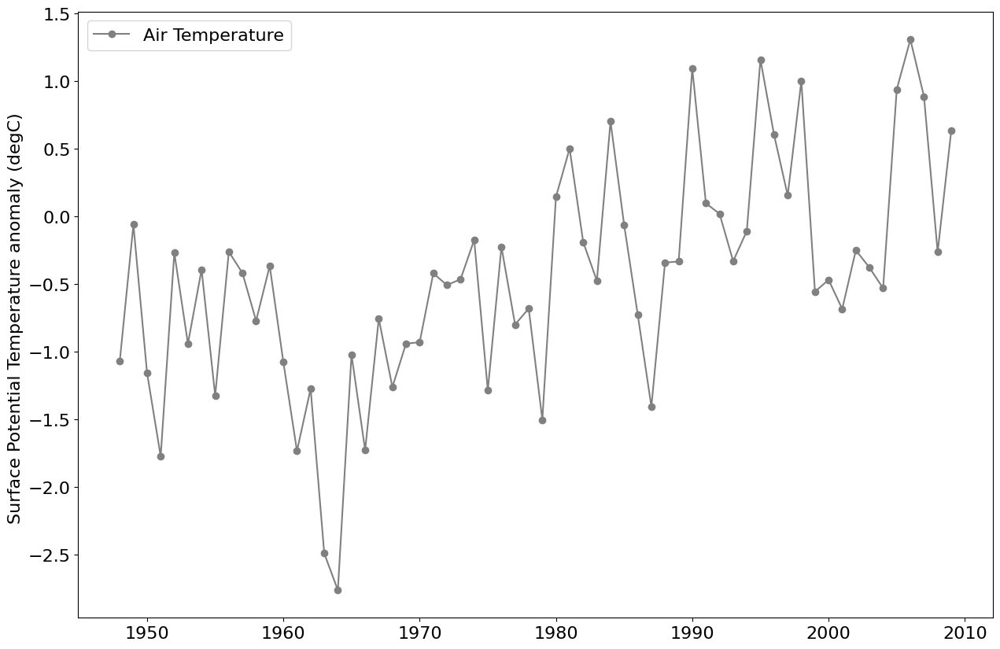

In [87]:
fig =plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111)
pylab.plot(years,np.nanmean(t_10_bias,axis=(1,2,3)), 'o-', color='gray', label = 'Air Temperature')
pylab.ylabel('Surface Potential Temperature anomaly (degC) ',fontsize = 16)
plt.legend(fontsize= 16); plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()

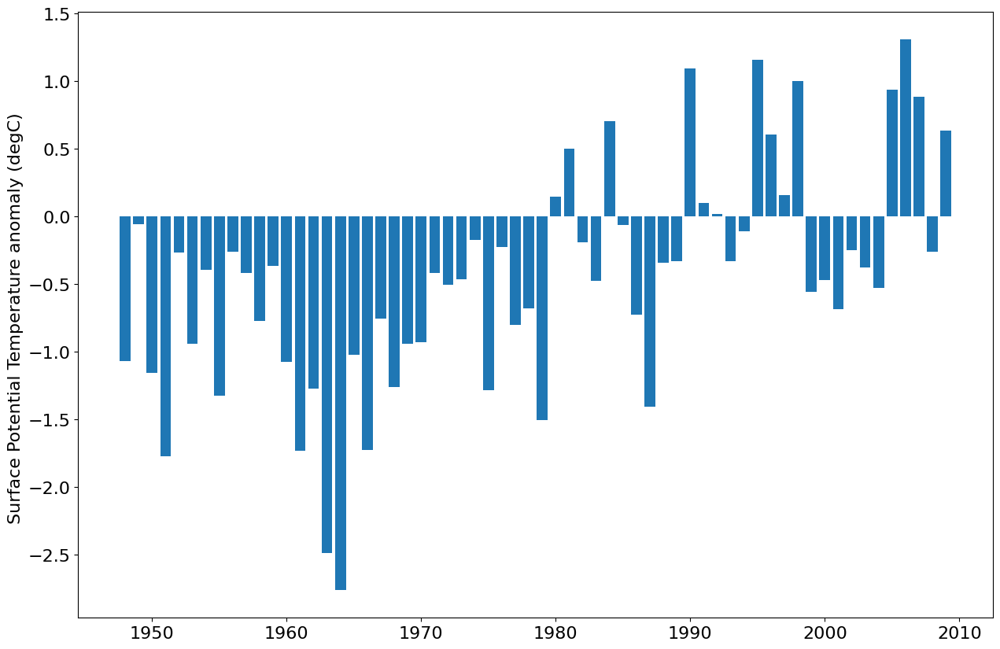

In [88]:
fig =plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111)
plt.bar(years,np.nanmean(t_10_bias,axis=(1,2,3)))
plt.ylabel('Surface Potential Temperature anomaly (degC) ',fontsize = 16)
plt.yticks(fontsize= 16); plt.xticks(fontsize= 16);
plt.show()